<a href="https://colab.research.google.com/github/OmerRosen/Kaggle/blob/main/IMDB_2022_Hit_or_Flop_Data_Exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Exploration

In [1]:
import requests
from IPython.core.display import HTML
import json
from time import sleep
import re
import requests
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import os
import time
import traceback
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler


<br><b>Observing The Data</b><br>
We will go over our different columns, make note of their scales and divide them into columns types for later preprocessing.

In [2]:
imdb_movie_dataset_path = "/content/drive/My Drive/Harvard HW/Course 4 - Final Project/imdb_movie_dataset_raw.csv"
if os.path.exists(imdb_movie_dataset_path):
  imdb_movie_raw_dataset = pd.read_csv(imdb_movie_dataset_path, index_col=['movie_id'])
  imdb_movie_raw_list = imdb_movie_raw_dataset.T.to_dict()
  
else:
  imdb_movie_raw_list = {}
  imdb_movie_raw_dataset = pd.DataFrame(imdb_movie_raw_list)

print(f"imdb_movie_raw_list contains {len(imdb_movie_raw_list)} records")
imdb_movie_raw_dataset.head(3)

imdb_movie_raw_list contains 631 records


,_finshed_successfully,budget_usd,runtime_min,movie_name,title_length,movie_desc_length,rating_catg,movie_year,release_year,release_month,...,language_welsh,genere_musical,language_croatian,language_wolof,language_latvian,language_hausa,language_norwegian,language_sioux,language_thai,language_albanian
movie_id,,,,,,,,,,,,,,,,,,,,,
tt1630029,True,350000000.0,192.0,Avatar: The Way of Water,5,40,PG-13,2022,2022.0,December,...,False,False,False,False,False,False,False,False,False,False
tt6710474,True,14300000.0,139.0,Everything Everywhere All at Once,5,31,R,2022,2022.0,April,...,False,False,False,False,False,False,False,False,False,False
tt10640346,True,78000000.0,189.0,Babylon,1,28,R,2022,2022.0,December,...,False,False,False,False,False,False,False,False,False,False


In [3]:
imdb_movie_raw_dataset.describe().T.astype(int)

,count,mean,std,min,25%,50%,75%,max
budget_usd,152,50055164,63470063,4000,5000000,23500000,75000000,350000000
runtime_min,628,99,17,48,89,97,107,192
title_length,631,2,1,1,2,2,3,12
movie_desc_length,631,28,9,3,21,28,36,51
movie_year,631,2022,0,2022,2022,2022,2022,2022
release_year,628,2022,0,2007,2022,2022,2022,2023
cast_count_total,631,263,347,0,85,151,312,2938
cast_count_director,631,1,0,0,1,1,1,11
cast_count_writer,631,2,2,0,1,2,3,15
cast_count_cast,631,38,37,0,18,29,44,450


## Categorize Column Types

<br>Upon looking at our data we can split it into the following types:<br>
1. Textual Columns - We will not be able to use them as they appear currently and they will be dropped for now.<br>
2. Numerical Columns - We will need to scale these later on.
3. Categorical Columns - We will need to convert these using One-Hot-Encoding.
4. Binary Columns
5. Result Column - This contain our Y values - Opening Week, Gross revenue and Metascore

In [4]:
# Predictor columns:
pred_metascore = ['pred_metascore']
pred_opening_weekend_us_canada = ['pred_opening_weekend_us_canada']
pred_gross_us_canada = ['pred_gross_us_canada']


columns_to_drop = ['movie_name','_finshed_successfully','artist','uri','movie_id','movie_year','pred_user_review_count','pred_critic_review_count','pred_total_vote_count','pred_gross_worldwide']
categorical_columns = []
binary_columns = []
numerical_columns = []
uncategorized_columns = []

binary_threshold = 20 # Below 10 positive values this column will be dropped
numerical_threshold = 30 # Below 10 total values this column will be dropped

dtype_dict = imdb_movie_raw_dataset.dtypes
for col, col_type in dtype_dict.items():
  if col not in columns_to_drop+pred_metascore+pred_opening_weekend_us_canada+pred_gross_us_canada:
    # handle binary columns:
    if col_type == bool:

      true_count = imdb_movie_raw_dataset[col].sum()
      
      if true_count<binary_threshold:
        print(f"dropping column {col} since it has only {true_count} actual records")
        columns_to_drop.append(col)
      else:
        binary_columns.append(col)
    
    # handle numerical columns:
    elif col_type in [float,int] :
      
      col_sum = imdb_movie_raw_dataset[col].sum()
      if col_sum<numerical_threshold:
        print(f"dropping column {col} since it has only {col_sum} sum values records")
        columns_to_drop.append(col)
      else:
        numerical_columns.append(col)

    elif col_type == object:
      #Try to convert to float:
      try:
        imdb_movie_raw_dataset[col] = imdb_movie_raw_dataset[col].astype(float)
        numerical_columns.append(col)
        print(f"col {col} was converted from type 'object' to type 'float'")
      # Check if categorical:
      except:
        if len(imdb_movie_raw_dataset[col].unique())<20:
          print(f"Col {col} is a categorical type column with {len(imdb_movie_raw_dataset[col].unique())} unique values:\n      {imdb_movie_raw_dataset[col].unique()}")
          categorical_columns.append(col)
        else:
          print(f"Unable to categorize column {col}")
          uncategorized_columns.append(col)
    else:
      print(col, col_type)
      uncategorized_columns.append(col)

predictor_columns = categorical_columns + binary_columns + numerical_columns
print(f"\nOur Dataset has: \n  {len(categorical_columns)} categorical_columns. \n  {len(binary_columns)} binary_columns. \n  {len(numerical_columns)} numerical_columns. \n   {len(uncategorized_columns)} uncategorized_columns. \n")

Col rating_catg is a categorical type column with 4 unique values:
      ['PG-13' 'R' 'Unrated' 'G']
Col release_month is a categorical type column with 13 unique values:
      ['December' 'April' 'November' 'August' 'May' 'January' 'March'
 'September' 'October' 'July' 'June' 'February' nan]
Unable to categorize column release_country
Col budget_currency is a categorical type column with 4 unique values:
      ['USD' nan 'EUR' 'CAD']
dropping column crew_nonbinary_count since it has only 2 sum values records
dropping column language_mandarin since it has only 1 actual records
dropping column language_cantonese since it has only 3 actual records
dropping column genere_history since it has only 10 actual records
dropping column language_italian since it has only 10 actual records
dropping column language_hungarian since it has only 1 actual records
dropping column language_japanese since it has only 2 actual records
dropping column language_russian since it has only 3 actual records
dro

In [5]:
def get_log_of_amounts(amount_series):
  amount_series_log = []
  for val in amount_series:
    if val==None:
      amount_series_log.append(val)
    else:
      amount_series_log.append(np.log(val))
  return amount_series_log

In [6]:
data = imdb_movie_raw_dataset[predictor_columns+['movie_name']].copy()
y_metascore = imdb_movie_raw_dataset['pred_metascore']
y_opening_weekend_us_canada = imdb_movie_raw_dataset['pred_opening_weekend_us_canada']
y_opening_weekend_us_canada_log = get_log_of_amounts(y_opening_weekend_us_canada)

y_gross_us_canada = imdb_movie_raw_dataset['pred_gross_us_canada']
y_gross_us_canada_log  = get_log_of_amounts(y_gross_us_canada)


## Missing Data

In [7]:
nan_counts = data.isna().sum()
nan_counts_sorted = nan_counts.sort_values(ascending=False)


# print the results
print(nan_counts_sorted)


crew_age_avg                   552
budget_usd                     479
budget_currency                472
runtime_min                      3
release_month                    3
                              ... 
cast_count_composer              0
cast_count_cinematographer       0
cast_count_editor                0
cast_count_casting_director      0
movie_name                       0
Length: 69, dtype: int64


In [8]:
data.tail(3)

,rating_catg,release_month,budget_currency,genere_action,genere_adventure,genere_fantasy,language_english,genere_comedy,genere_drama,language_spanish,...,main_crew_count,crew_age_avg,crew_age_missing,crew_female_count,crew_lgbt_count,crew_prestige_wins,crew_prestige_nominations,crew_awards_wins,crew_awards_nominations,movie_name
movie_id,,,,,,,,,,,,,,,,,,,,,
tt22176928,Unrated,November,NaN,False,False,False,True,True,False,False,...,5,NaN,0,0,0,0,0,1,0,Uninvited for the Holidays
tt18272884,R,April,USD,False,False,False,True,False,True,False,...,6,57.2,1,0,0,1,0,79,162,Padre Pio
tt18361658,Unrated,October,USD,False,False,True,True,False,True,False,...,5,NaN,4,1,0,0,0,0,1,Torn: A Wicked Trilogy


For any missing currency, assume USD is referred

### Fill missing data

If budget currency is missing, it is safe to assume the currency is USD

In [9]:

data['budget_currency'].fillna('USD', inplace=True)

If release_month is missin, we will fill it based on the Mode of release_month

In [10]:
mode_release_month = data['release_month'].mode()[0]

# Fill missing values in the 'release_month' column with the mode
data['release_month'].fillna(mode_release_month, inplace=True)

### Imputation

In [11]:
data[['budget_usd','crew_age_avg','crew_age_avg']].describe()

,budget_usd,crew_age_avg,crew_age_avg
count,1.520000e+02,79.000000,79.000000
mean,5.005516e+07,47.483785,47.483785
std,6.347006e+07,8.494870,8.494870
min,4.000000e+03,29.600000,29.600000
25%,5.000000e+06,41.100000,41.100000
50%,2.350000e+07,47.250000,47.250000
75%,7.500000e+07,52.250000,52.250000
max,3.500000e+08,70.500000,70.500000


In [12]:
nan_mask = data['budget_usd'].isna()
nan_rows = data.loc[nan_mask]
nan_count = data['budget_usd'].isna().sum()
print(f"There are {nan_count} rows (out of {data.shape[0]}) with NaN values in the 'budget_usd' column.")

nan_rows[['budget_usd','movie_name']].head(10)

There are 479 rows (out of 631) with NaN values in the 'budget_usd' column.


,budget_usd,movie_name
movie_id,,
tt11813216,NaN,The Banshees of Inisherin
tt19770238,NaN,Aftersun
tt18925334,NaN,Pearl
tt8110652,NaN,Bodies Bodies Bodies
tt12758486,NaN,Chevalier
tt21440780,NaN,How to Blow Up a Pipeline
tt13669038,NaN,Women Talking
tt14402146,NaN,Empire of Light
tt3447590,NaN,Roald Dahl's Matilda the Musical


Use IterativeImputer in order to fill in gaps regarding Budget.

In [13]:
# Save a backup copy
budget_usd_original = data['budget_usd'].copy()

In [14]:
scaler = StandardScaler()

data['budget_usd'] = scaler.fit_transform(data[['budget_usd']])

imputer_intger = KNNImputer(n_neighbors=10, weights='distance')
X_imputed = pd.DataFrame(imputer_intger.fit_transform(data[numerical_columns+binary_columns]), columns=numerical_columns+binary_columns, index=data.index)
X_imputed['budget_usd'] = scaler.inverse_transform(X_imputed[['budget_usd']]).astype(int)

for colm in categorical_columns:
  X_imputed[colm] = data[colm]



Add the fact budget was missing as a feature:

In [15]:
X_imputed["was_budget_missing"] = nan_mask
binary_columns.append("was_budget_missing")
X_imputed

,budget_usd,runtime_min,title_length,movie_desc_length,release_year,cast_count_total,cast_count_director,cast_count_writer,cast_count_cast,cast_count_producer,...,genere_mystery,genere_romance,genere_crime,genere_sci-fi,genere_biography,genere_family,rating_catg,release_month,budget_currency,was_budget_missing
movie_id,,,,,,,,,,,,,,,,,,,,,
tt1630029,350000000,192.000000,5.0,40.0,2022.0,2201.0,1.0,9.0,68.0,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,PG-13,December,USD,False
tt6710474,14300000,139.000000,5.0,31.0,2022.0,564.0,2.0,2.0,44.0,15.0,...,0.0,0.0,0.0,0.0,0.0,0.0,R,April,USD,False
tt10640346,78000000,189.000000,1.0,28.0,2022.0,1067.0,1.0,1.0,450.0,14.0,...,0.0,0.0,0.0,0.0,0.0,0.0,R,December,USD,False
tt9764362,35000000,107.000000,2.0,26.0,2022.0,410.0,1.0,2.0,36.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,R,November,USD,False
tt13833688,10000000,117.000000,2.0,14.0,2022.0,274.0,1.0,3.0,10.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,R,December,USD,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt12126628,250000,80.000000,3.0,30.0,2022.0,64.0,1.0,2.0,29.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Unrated,January,USD,False
tt24251826,60000,94.401068,1.0,38.0,2022.0,29.0,2.0,2.0,21.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Unrated,April,USD,False
tt22176928,114312,72.000000,4.0,15.0,2022.0,18.0,1.0,1.0,10.0,5.0,...,0.0,0.0,1.0,0.0,0.0,0.0,Unrated,November,USD,True


Check to see that original budget_usd values were not shifted or distorted

In [16]:
print(budget_usd_original[0:6])
print(X_imputed['budget_usd'].head(5))

movie_id
tt1630029     350000000.0
tt6710474      14300000.0
tt10640346     78000000.0
tt9764362      35000000.0
tt13833688     10000000.0
tt12593682     85900000.0
Name: budget_usd, dtype: float64
movie_id
tt1630029     350000000
tt6710474      14300000
tt10640346     78000000
tt9764362      35000000
tt13833688     10000000
Name: budget_usd, dtype: int64


Check to see that the imputed numbers make sense

In [17]:
print(budget_usd_original[-10:])
print(X_imputed['budget_usd'].tail(10))

movie_id
tt12973010         NaN
tt7875666          NaN
tt9169280          NaN
tt10650376         NaN
tt12757372      7000.0
tt12126628    250000.0
tt24251826     60000.0
tt22176928         NaN
tt18272884         NaN
tt18361658         NaN
Name: budget_usd, dtype: float64
movie_id
tt12973010    8839884
tt7875666      269107
tt9169280      416200
tt10650376     703940
tt12757372       7000
tt12126628     250000
tt24251826      60000
tt22176928     114312
tt18272884    6872643
tt18361658    7877273
Name: budget_usd, dtype: int64


## Data Balance

<br><b>Data Balance</b><br>
We will observe the ratio in our y values, in addition to our categorical and binary columns, and observe if there is an imbalance that requires intervention.



0 0 rating_catg None
1 1 release_month None
2 2 budget_currency None
genere action 128
genere adventure 74
genere fantasy 28
language english 631
genere comedy 201
genere drama 252
language spanish 40
language french 20
genere horror 164
genere thriller 184
genere animation 37
genere mystery 64
genere romance 83
genere crime 57
genere sci-fi 39
genere biography 22
genere family 36
20 3 was_budget_missing 2


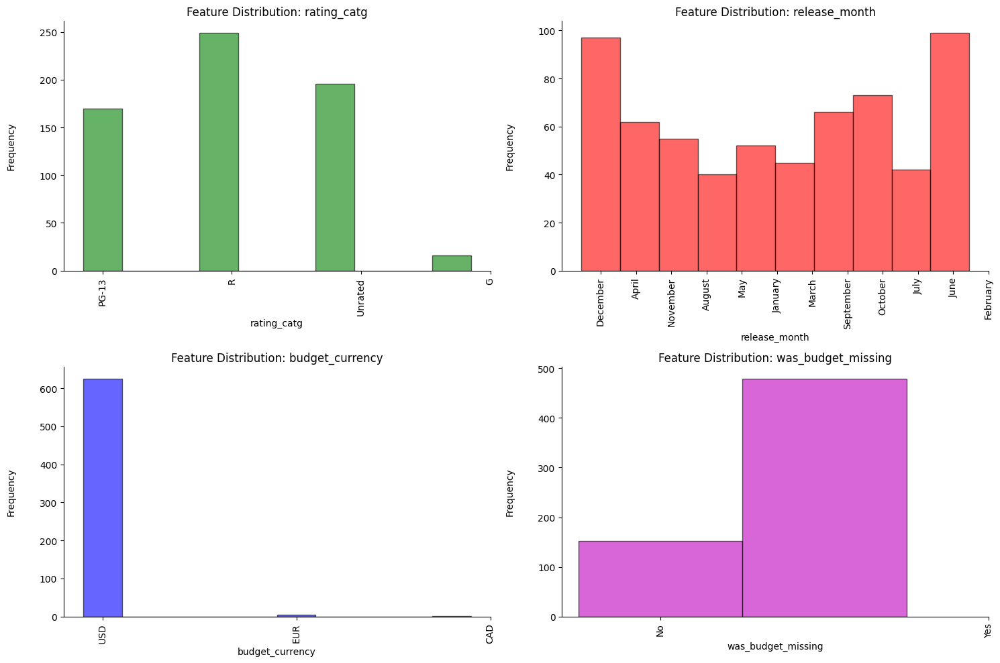

In [18]:
import math

cols_for_histogram = [col for col in categorical_columns +binary_columns if "genere_" not in col and "language_" not in col]
feature_num = len(cols_for_histogram)

binary_catg_dict = {"genere":{},"language":{}}

plot_per_row = 2
row_num = math.ceil(feature_num/plot_per_row)

fig = plt.gcf()
fig.set_size_inches(15,10)

c_list = ['g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink']

j = 0
for i,col in enumerate(categorical_columns +binary_columns):
  col_vals = X_imputed[[col]]
  col_vals_series = X_imputed[col]
  unique_vals = len(col_vals_series.unique())
  
  if col in binary_columns:
    col_vals_series = X_imputed[col].astype(int)
    bin_count = unique_vals
  else:
    bin_count = None
    
  if col in cols_for_histogram:

    print(i,j,col,bin_count)
    ax = fig.add_subplot(row_num,plot_per_row,j+1)
    j += 1
    height, bins, patches = ax.hist(x=col_vals_series, bins=bin_count, alpha=0.6, label=f"Feature {col}",density=False,edgecolor='k', color=c_list[i], align='left')
    
    if col in binary_columns:
      ax.set_xticks((0,1), labels=('No', 'Yes'))
    
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency',rotation=90,labelpad=25)
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_title(f'Feature Distribution: {col}')
    plt.xticks(rotation=90)

  else:
    categ = col.split('_')[0]
    categ_prop = col.split('_')[1]
    true_prop_count = col_vals_series.sum()
    print(categ,categ_prop,true_prop_count)
    binary_catg_dict[categ][categ_prop] = true_prop_count
    

plt.tight_layout()
plt.plot;

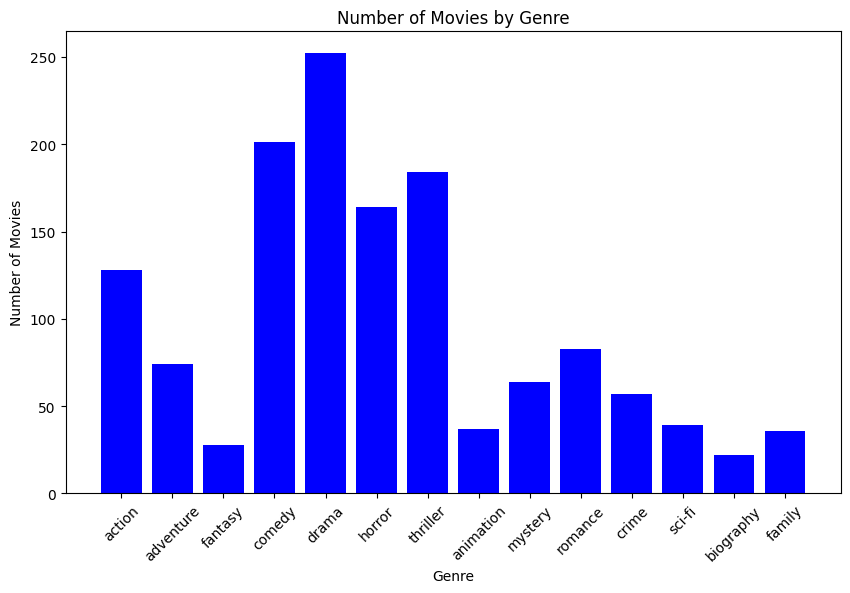

In [19]:
# Plot 'genere' bar plot
plt.figure(figsize=(10, 6))
plt.bar(binary_catg_dict['genere'].keys(), binary_catg_dict['genere'].values(), color='blue')
plt.title('Number of Movies by Genre')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45)
plt.show()

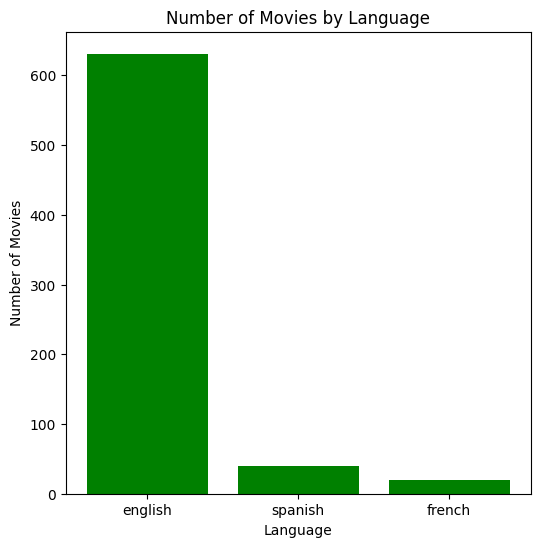

In [20]:
plt.figure(figsize=(6, 6))
plt.bar(binary_catg_dict['language'].keys(), binary_catg_dict['language'].values(), color='green')
plt.title('Number of Movies by Language')
plt.xlabel('Language')
plt.ylabel('Number of Movies')
plt.show()

<br><b>Predictor Corralation</b><br>
We will observe the relationship between each predictor individually and attempt to see if any noteable correlation are spotted between the feature and whether or not the song is a hit.<br><br>

In the plot below, we can notice some interesting relationships:<br>
1. Dancability - If your song has less than ~0.2 dancability rate you will not become a hit.
2. Loudness - There is a correlation between loudness and success
3. Speechness - If your speech-to-music ration is higher than 0.45 it decreases your odds significantly at having a hit.
4. Duration - The longer your song lasts the fewer people will listen to it again.
5. Sections - The number of sections the particular track has appear to have an effect on its success rate.

In [21]:
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm


In [22]:
X_imputed

,budget_usd,runtime_min,title_length,movie_desc_length,release_year,cast_count_total,cast_count_director,cast_count_writer,cast_count_cast,cast_count_producer,...,genere_mystery,genere_romance,genere_crime,genere_sci-fi,genere_biography,genere_family,rating_catg,release_month,budget_currency,was_budget_missing
movie_id,,,,,,,,,,,,,,,,,,,,,
tt1630029,350000000,192.000000,5.0,40.0,2022.0,2201.0,1.0,9.0,68.0,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,PG-13,December,USD,False
tt6710474,14300000,139.000000,5.0,31.0,2022.0,564.0,2.0,2.0,44.0,15.0,...,0.0,0.0,0.0,0.0,0.0,0.0,R,April,USD,False
tt10640346,78000000,189.000000,1.0,28.0,2022.0,1067.0,1.0,1.0,450.0,14.0,...,0.0,0.0,0.0,0.0,0.0,0.0,R,December,USD,False
tt9764362,35000000,107.000000,2.0,26.0,2022.0,410.0,1.0,2.0,36.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,R,November,USD,False
tt13833688,10000000,117.000000,2.0,14.0,2022.0,274.0,1.0,3.0,10.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,R,December,USD,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt12126628,250000,80.000000,3.0,30.0,2022.0,64.0,1.0,2.0,29.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Unrated,January,USD,False
tt24251826,60000,94.401068,1.0,38.0,2022.0,29.0,2.0,2.0,21.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Unrated,April,USD,False
tt22176928,114312,72.000000,4.0,15.0,2022.0,18.0,1.0,1.0,10.0,5.0,...,0.0,0.0,1.0,0.0,0.0,0.0,Unrated,November,USD,True


## Features Correlation with Y

In [23]:
X = X_imputed[categorical_columns +binary_columns + numerical_columns].copy()

<ipython-input-24-c0e623cf6a59>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdYlGn')


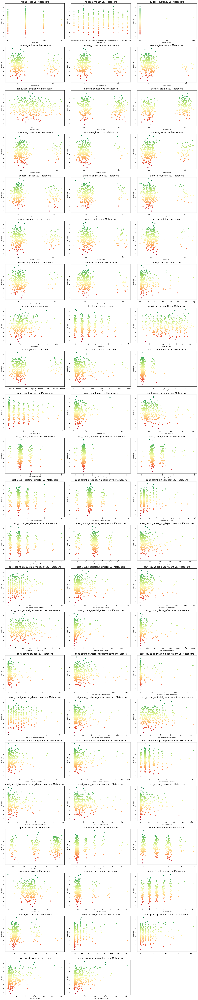

In [24]:
color_map = []

y_pred = y_metascore

for val in y_pred:
    if val==1:
        color_map.append('g')
    else:
        color_map.append('r')
        
coeff_num = len(predictor_columns)
plot_col_num = 3
row_num = math.ceil(coeff_num/plot_col_num)

fig = plt.gcf()
fig.set_size_inches(20,100)

for i,pred_col in enumerate(predictor_columns):
    
    sigma = 0.1
    
    mu =0.001
    
    # generate normally distributed samples
    y_noise = sigma * np.random.randn(X.shape[0]) + mu
    x_noise = sigma * np.random.randn(X.shape[0]) + mu
    
    ax = fig.add_subplot(row_num,plot_col_num,i+1)
    x_val = X[pred_col]
    if pred_col in binary_columns:
        x_val = X[pred_col]+x_noise
        ax.set_xticks((0,1), labels=('No', 'Yes'))
        
    if pred_col in categorical_columns:
        x_val = X[pred_col]

    if pred_col in numerical_columns:
        x_val = X[pred_col]+x_noise
    
    cmap = cm.get_cmap('RdYlGn')

    ax.scatter(x_val,y_pred, cmap=cmap, c=y_pred)
    ax.set_xlabel(f'{pred_col}', fontsize=8)
    ax.set_ylabel(f'Metascore', fontsize=8)
    #ax.set_xlabel('Hit', fontsize=8)
    #ax.set_xticks((0,1), labels=('No', 'Yes'), fontsize=14)
    ax = plt.gca()
    ax.set_title(f'{pred_col} vs. Metascore').set_size(16)

    
plt.tight_layout()
plt.plot;

<ipython-input-25-7367b255be26>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdYlGn')


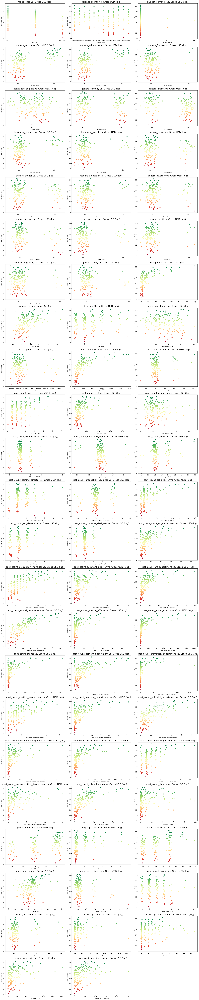

In [25]:
color_map = []

y_pred = y_gross_us_canada_log

for val in y_pred:
    if val==1:
        color_map.append('g')
    else:
        color_map.append('r')
        
coeff_num = len(predictor_columns)
plot_col_num = 3
row_num = math.ceil(coeff_num/plot_col_num)

fig = plt.gcf()
fig.set_size_inches(20,100)

for i,pred_col in enumerate(predictor_columns):
    
    sigma = 0.1
    
    mu =0.001
    
    # generate normally distributed samples
    y_noise = sigma * np.random.randn(X.shape[0]) + mu
    x_noise = sigma * np.random.randn(X.shape[0]) + mu
    
    ax = fig.add_subplot(row_num,plot_col_num,i+1)
    x_val = X[pred_col]
    if pred_col in binary_columns:
        x_val = X[pred_col]+x_noise
        ax.set_xticks((0,1), labels=('No', 'Yes'))
        
    if pred_col in categorical_columns:
        x_val = X[pred_col]

    if pred_col in numerical_columns:
        x_val = X[pred_col]+x_noise
    
    cmap = cm.get_cmap('RdYlGn')

    ax.scatter(x_val,y_pred, cmap=cmap, c=y_pred)
    ax.set_xlabel(f'{pred_col}', fontsize=8)
    ax.set_ylabel(f'Gross USD (log)', fontsize=8)
    #ax.set_xlabel('Hit', fontsize=8)
    #ax.set_xticks((0,1), labels=('No', 'Yes'), fontsize=14)
    ax = plt.gca()
    ax.set_title(f'{pred_col} vs. Gross USD (log)').set_size(16)

    
plt.tight_layout()
plt.plot;

<ipython-input-26-1352ffc45c15>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdYlGn')


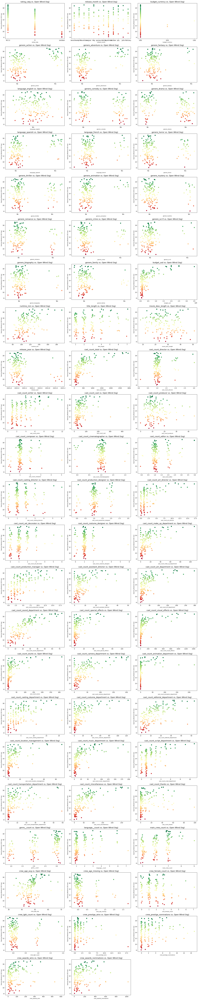

In [26]:
color_map = []

y_pred = y_opening_weekend_us_canada_log

for val in y_pred:
    if val==1:
        color_map.append('g')
    else:
        color_map.append('r')
        
coeff_num = len(predictor_columns)
plot_col_num = 3
row_num = math.ceil(coeff_num/plot_col_num)

fig = plt.gcf()
fig.set_size_inches(20,100)

for i,pred_col in enumerate(predictor_columns):
    
    sigma = 0.1
    
    mu =0.001
    
    # generate normally distributed samples
    y_noise = sigma * np.random.randn(X.shape[0]) + mu
    x_noise = sigma * np.random.randn(X.shape[0]) + mu
    
    ax = fig.add_subplot(row_num,plot_col_num,i+1)
    x_val = X[pred_col]
    if pred_col in binary_columns:
        x_val = X[pred_col]+x_noise
        ax.set_xticks((0,1), labels=('No', 'Yes'))
        
    if pred_col in categorical_columns:
        x_val = X[pred_col]

    if pred_col in numerical_columns:
        x_val = X[pred_col]+x_noise
    
    cmap = cm.get_cmap('RdYlGn')

    ax.scatter(x_val,y_pred, cmap=cmap, c=y_pred)
    ax.set_xlabel(f'{pred_col}', fontsize=8)
    ax.set_ylabel(f'Opening Weekend USD (log)', fontsize=8)
    #ax.set_xlabel('Hit', fontsize=8)
    #ax.set_xticks((0,1), labels=('No', 'Yes'), fontsize=14)
    ax = plt.gca()
    ax.set_title(f'{pred_col} vs. Open Wknd (log)').set_size(13)

    
plt.tight_layout()
plt.plot;

## One Hot Encoding

<br><b>One Hot Encoding</b><br>
We will convert all of our categorical columns into binary columns.

In [65]:
for i,col in enumerate(categorical_columns):
    onehot = pd.get_dummies(X[col], prefix=col)
    if i==0:
        X_ohe = X.join(onehot)
    else:
        X_ohe = X_ohe.join(onehot)
    X_ohe = X_ohe.drop([col], axis=1)
    print(f"Col {col} - Converted into {onehot.shape[1]} hot-encoded columns")

rating_cols = [col for col in X_ohe.columns if "rating_catg" in col or "release_month" in col or "budget_currency" in col]
X_ohe[rating_cols]

Col rating_catg - Converted into 4 hot-encoded columns
Col release_month - Converted into 12 hot-encoded columns
Col budget_currency - Converted into 3 hot-encoded columns


,rating_catg_G,rating_catg_PG-13,rating_catg_R,rating_catg_Unrated,release_month_April,release_month_August,release_month_December,release_month_February,release_month_January,release_month_July,release_month_June,release_month_March,release_month_May,release_month_November,release_month_October,release_month_September,budget_currency_CAD,budget_currency_EUR,budget_currency_USD
movie_id,,,,,,,,,,,,,,,,,,,
tt1630029,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
tt6710474,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
tt10640346,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
tt9764362,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
tt13833688,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt12126628,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
tt24251826,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
tt22176928,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1


## Feature Correlation

<br><b>Feature Correlation</b><br>
We will check to see if there is any high correlation within our features.<br>
If the correlation is too high, we will drop one of the features.

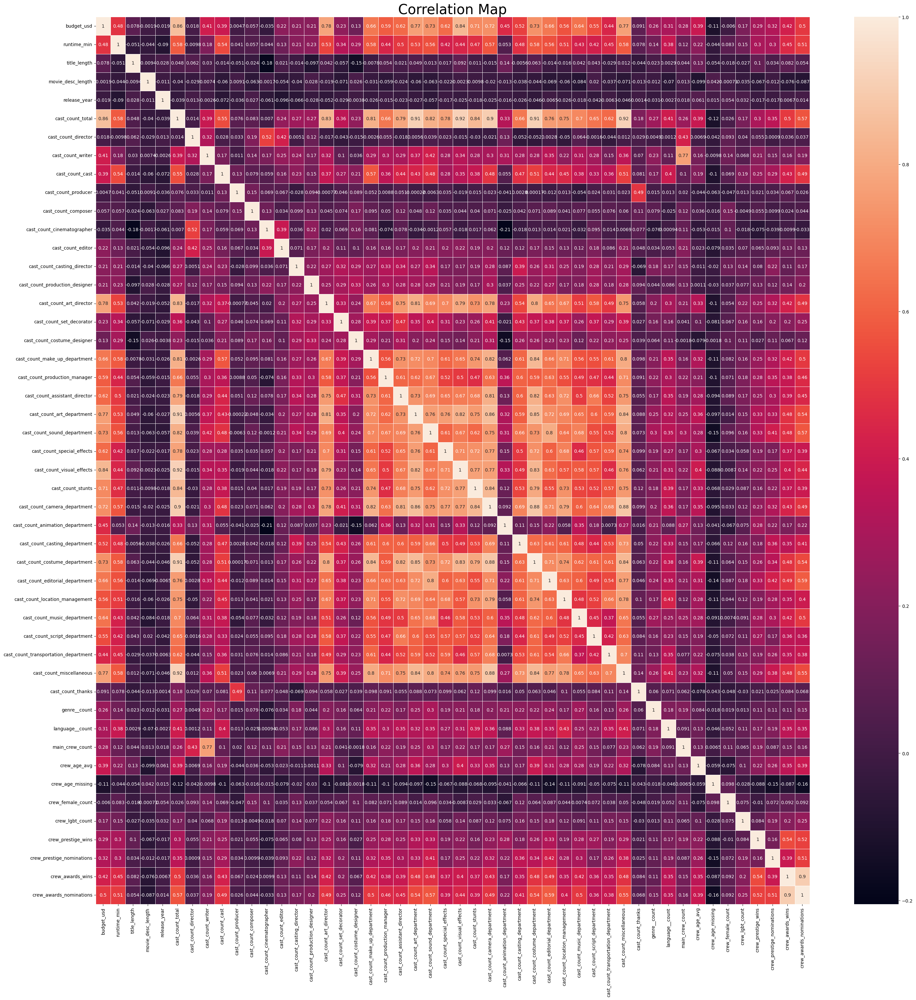

In [28]:
fig, ax = plt.subplots(figsize=(35,35))
ax.set_title("Correlation Map", fontdict={'fontsize': 30})
dataplot = sns.heatmap(X_ohe[numerical_columns].corr(), annot=True, linewidths=0.5, ax=ax)

In [29]:
print(X_ohe.columns)

Index(['genere_action', 'genere_adventure', 'genere_fantasy',
       'language_english', 'genere_comedy', 'genere_drama', 'language_spanish',
       'language_french', 'genere_horror', 'genere_thriller',
       'genere_animation', 'genere_mystery', 'genere_romance', 'genere_crime',
       'genere_sci-fi', 'genere_biography', 'genere_family',
       'was_budget_missing', 'budget_usd', 'runtime_min', 'title_length',
       'movie_desc_length', 'release_year', 'cast_count_total',
       'cast_count_director', 'cast_count_writer', 'cast_count_cast',
       'cast_count_producer', 'cast_count_composer',
       'cast_count_cinematographer', 'cast_count_editor',
       'cast_count_casting_director', 'cast_count_production_designer',
       'cast_count_art_director', 'cast_count_set_decorator',
       'cast_count_costume_designer', 'cast_count_make_up_department',
       'cast_count_production_manager', 'cast_count_assistant_director',
       'cast_count_art_department', 'cast_count_sound_depar

In [68]:
corr_matrix = X_ohe.corr().abs()
cols_to_keep_regradless = ['budget_usd', 'cast_count_total']

# Create a boolean mask of highly correlated features
print(f"Number Of features before: {X_ohe.shape[1]}")
high_corr_features = np.full(corr_matrix.shape[0], False, dtype=bool)
for i in range(corr_matrix.shape[0]):
    for j in range(i+1, corr_matrix.shape[0]):
        if corr_matrix.iloc[i,j] >= 0.8:
            if not high_corr_features[j]:
                high_corr_features[i] = True

# Select the columns to keep
columns_to_drop = [column for column in X_ohe.columns if high_corr_features[X_ohe.columns.get_loc(column)] and column not in cols_to_keep_regradless]
print(f"columns_to_drop: {columns_to_drop}")
columns_to_keep = [column for column in X_ohe.columns if column not in columns_to_drop]
numerical_columns = [col for col in numerical_columns if col in columns_to_keep]
numerical_columns


# Create a new DataFrame with only the selected columns
X_ohe_reduced = X_ohe[columns_to_keep]
print(f"Number Of features after: {X_ohe_reduced.shape[1]}")
X_ohe_reduced.head(3)

Number Of features before: 85
columns_to_drop: ['cast_count_art_director', 'cast_count_make_up_department', 'cast_count_assistant_director', 'cast_count_art_department', 'cast_count_sound_department', 'cast_count_visual_effects', 'cast_count_stunts', 'cast_count_camera_department', 'cast_count_costume_department', 'crew_awards_wins', 'budget_currency_EUR']
Number Of features after: 74


,genere_action,genere_adventure,genere_fantasy,language_english,genere_comedy,genere_drama,language_spanish,language_french,genere_horror,genere_thriller,...,release_month_January,release_month_July,release_month_June,release_month_March,release_month_May,release_month_November,release_month_October,release_month_September,budget_currency_CAD,budget_currency_USD
movie_id,,,,,,,,,,,,,,,,,,,,,
tt1630029,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
tt6710474,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
tt10640346,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1


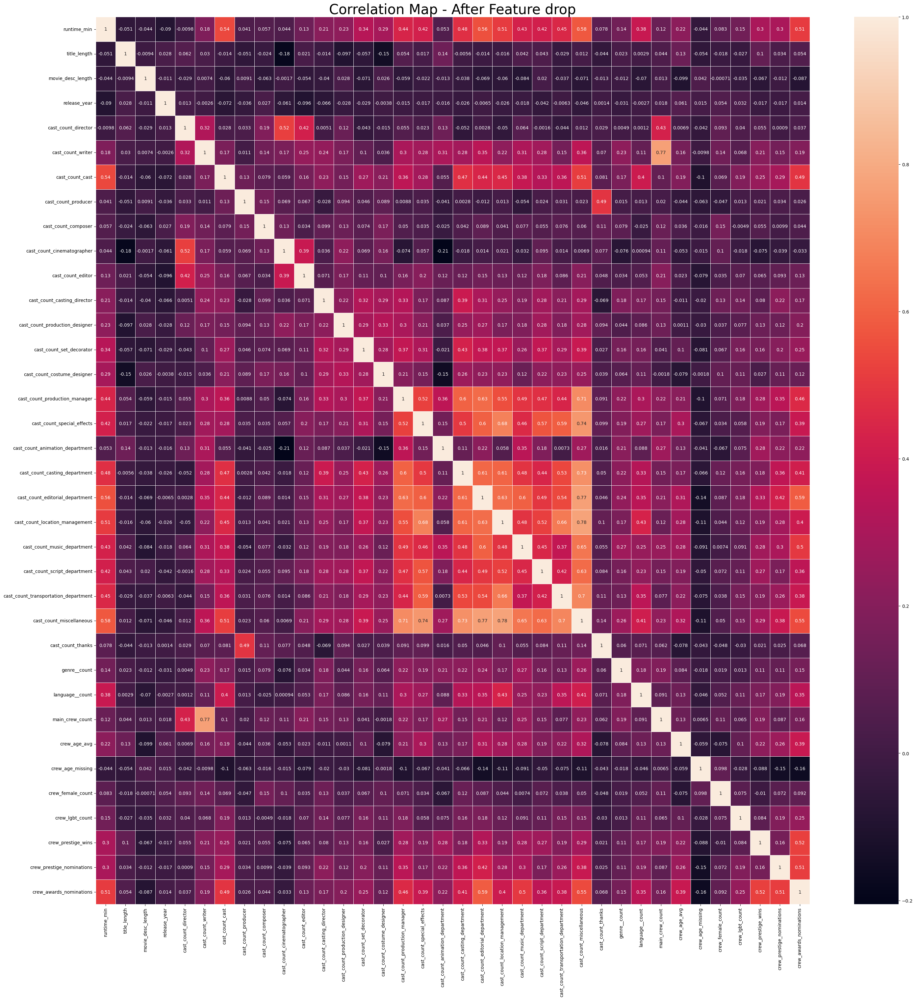

In [69]:
fig, ax = plt.subplots(figsize=(35,35))
ax.set_title("Correlation Map - After Feature drop", fontdict={'fontsize': 30})
dataplot = sns.heatmap(X_ohe_reduced[numerical_columns].corr(), annot=True, linewidths=0.5, ax=ax)

In [ ]:
# Data Preperation - Opening Week

# Data Preperation - Opening Week

In [95]:
import os
import math
import warnings
import itertools
from timeit import default_timer as timer

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt

import requests
from bs4 import BeautifulSoup 
import re
import time
import progressbar

from sklearn.model_selection import cross_val_score, train_test_split,cross_validate
from sklearn.preprocessing import OneHotEncoder
from sklearn import preprocessing
from sklearn.base import clone
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve,auc,confusion_matrix
from sklearn.impute import KNNImputer

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score


import seaborn as sns

In [100]:
opening_week_na_mask = y_opening_weekend_us_canada.isna()
y_opening_week = y_opening_weekend_us_canada[~opening_week_na_mask]
y_opening_week_log = np.log(y_opening_week)
X_opening_week = X_ohe_reduced[~opening_week_na_mask]
X_opening_week.shape,y_opening_week.shape
print(f"Only {len(y_opening_week)} out of {len(opening_week_na_mask)} records had MetaScore and will be kept")

Only 147 out of 631 records had MetaScore and will be kept


In [101]:
x_train_raw, x_test_raw, y_train, y_test = train_test_split(X_opening_week, y_opening_week_log, train_size = 0.8, random_state=0)
print(f"Train DataSet: {x_train_raw.shape[0]} with {x_train_raw.shape[1]} features")
print(f"Test DataSet: {x_test_raw.shape[0]} with {x_test_raw.shape[1]} features")

Train DataSet: 117 with 74 features
Test DataSet: 30 with 74 features


In [102]:
# We will scale on the training dataset then apply it to both train and test
scalar_metascore = StandardScaler(copy=True, with_mean=True, with_std=True).fit(x_train_raw[numerical_columns])

x_train_scaled = pd.DataFrame(scalar_metascore.transform(x_train_raw[numerical_columns]),columns=numerical_columns, index=x_train_raw.index)
x_test_scaled = pd.DataFrame(scalar_metascore.transform(x_test_raw[numerical_columns]),columns=numerical_columns, index=x_test_raw.index)
  
x_train_scaled.head(5).round(3)

,runtime_min,title_length,movie_desc_length,release_year,cast_count_director,cast_count_writer,cast_count_cast,cast_count_producer,cast_count_composer,cast_count_cinematographer,...,genre__count,language__count,main_crew_count,crew_age_avg,crew_age_missing,crew_female_count,crew_lgbt_count,crew_prestige_wins,crew_prestige_nominations,crew_awards_nominations
movie_id,,,,,,,,,,,,,,,,,,,,,
tt10665342,-0.046,-0.363,-0.713,-0.292,-0.302,1.747,0.000,0.612,3.375,0.178,...,-0.503,-0.495,0.997,0.394,-0.318,1.324,-0.318,-0.162,-0.780,-0.022
tt11564570,1.393,-0.363,-1.645,-0.292,-0.302,-0.885,-0.315,-1.010,-0.215,0.178,...,0.834,-0.495,-1.163,0.546,-0.318,-0.446,-0.318,-0.547,2.441,1.563
tt4123432,1.547,2.175,-0.596,-0.292,-0.302,0.431,0.260,-0.064,-0.215,0.178,...,0.834,0.321,-0.083,0.546,-0.318,-0.446,-0.318,0.224,0.652,0.517
tt12193804,1.650,2.809,0.801,-0.292,-0.302,-0.885,2.670,3.857,-0.215,0.178,...,0.834,-0.495,-1.163,0.330,-0.318,0.439,-0.318,-0.162,1.010,-0.121
tt14402146,0.160,0.271,-0.596,-0.292,-0.302,-0.885,-0.278,-0.875,1.580,0.178,...,-0.503,-0.495,-1.163,0.546,-0.318,-0.446,-0.318,1.381,-0.780,1.603


Mean Squared Error: 4.5358
R-squared: 0.3019


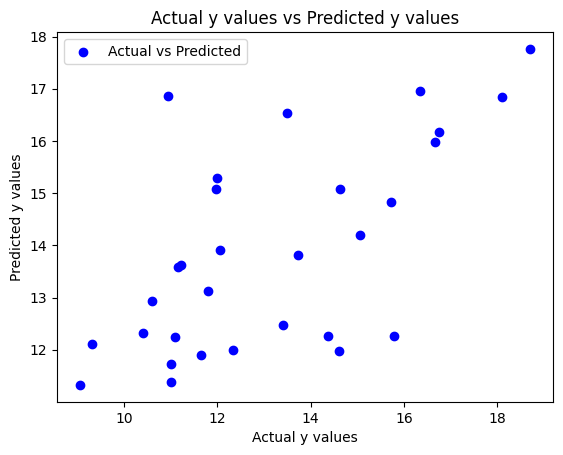

In [103]:
# Create a Random Forest Regressor
rf_regressor = RandomForestRegressor(n_estimators=5000, random_state=42)

# Train the model
rf_regressor.fit(x_train_scaled, y_train.ravel())

# Make predictions
y_pred = rf_regressor.predict(x_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse:.4f}")
print(f"R-squared: {r2:.4f}")

# Plot actual y values against predicted y values
plt.scatter(y_test, y_pred, color='blue', label='Actual vs Predicted')
plt.xlabel('Actual y values')
plt.ylabel('Predicted y values')
plt.title('Actual y values vs Predicted y values')
plt.legend()
plt.show()

# Data Preperation - Metascore

## Filtering out missing data

In [71]:
metascore_na_mask = y_metascore.isna()
y_meta = y_metascore[~metascore_na_mask]
X_meta = X_ohe_reduced[~metascore_na_mask]
X_meta.shape,y_meta.shape
print(f"Only {len(y_meta)} out of {len(metascore_na_mask)} records had MetaScore and will be kept")

Only 322 out of 631 records had MetaScore and will be kept


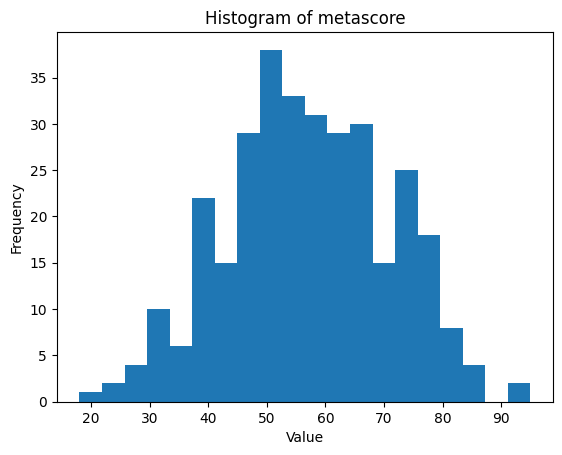

In [84]:
# Create the histogram
plt.hist(y_meta, bins=20)  # You can adjust the number of bins as needed

# Add labels
plt.xlabel('Value')
plt.ylabel('Frequency')

# Add a title
plt.title('Histogram of metascore')

# Display the plot
plt.show()

## Split Train-Test data

<br><b>Split Train-Test Data</b><br>
Since our dataset is medium sized it is best to use a standard 20% of the data as test:

In [34]:
x_train_raw, x_test_raw, y_train, y_test = train_test_split(X_meta, y_meta, train_size = 0.8, random_state=0)
print(f"Train DataSet: {x_train_raw.shape[0]} with {x_train_raw.shape[1]} features")
print(f"Test DataSet: {x_test_raw.shape[0]} with {x_test_raw.shape[1]} features")

Train DataSet: 257 with 73 features
Test DataSet: 65 with 73 features


## Scaling

<br><b>Scaling</b><br>
We will fit the scale on the training dataset then use it to transform both train and test datasets.

In [85]:
# We will scale on the training dataset then apply it to both train and test
scalar_metascore = StandardScaler(copy=True, with_mean=True, with_std=True).fit(x_train_raw[numerical_columns])

x_train_scaled = pd.DataFrame(scalar_metascore.transform(x_train_raw[numerical_columns]),columns=numerical_columns, index=x_train_raw.index)
x_test_scaled = pd.DataFrame(scalar_metascore.transform(x_test_raw[numerical_columns]),columns=numerical_columns, index=x_test_raw.index)
  
x_train_scaled.head(5).round(3)

,runtime_min,title_length,movie_desc_length,release_year,cast_count_director,cast_count_writer,cast_count_cast,cast_count_producer,cast_count_composer,cast_count_cinematographer,...,genre__count,language__count,main_crew_count,crew_age_avg,crew_age_missing,crew_female_count,crew_lgbt_count,crew_prestige_wins,crew_prestige_nominations,crew_awards_nominations
movie_id,,,,,,,,,,,,,,,,,,,,,
tt14592064,-0.641,-0.386,0.778,-0.321,2.703,-0.428,-0.143,0.097,-0.251,0.149,...,-0.489,-0.427,1.053,0.062,-0.340,-1.273,-0.325,-0.543,0.709,-0.433
tt14592998,-0.422,-0.386,0.427,-0.321,-0.317,1.883,-0.164,-0.836,1.645,0.149,...,0.820,-0.427,1.053,-1.092,-0.340,-0.475,-0.325,1.293,-0.350,-0.736
tt15096128,-0.750,-1.065,-0.041,-0.321,-0.317,-0.428,-0.456,0.764,-2.147,-3.671,...,-0.489,-0.427,0.000,-1.228,1.846,1.120,-0.325,-0.543,-0.703,-0.822
tt1798632,-0.696,-1.065,-0.860,-0.321,-0.317,0.034,-0.248,-0.036,3.541,0.149,...,0.820,-0.427,0.000,-0.005,-0.340,0.323,-0.325,-0.543,0.003,-0.487
tt12593682,1.114,-0.386,-1.329,-0.321,-0.317,0.034,0.775,-0.570,-0.251,0.149,...,0.820,2.538,0.000,0.540,-0.340,-0.475,-0.325,0.375,0.356,1.263


Mean Squared Error: 152.7458
R-squared: 0.1662


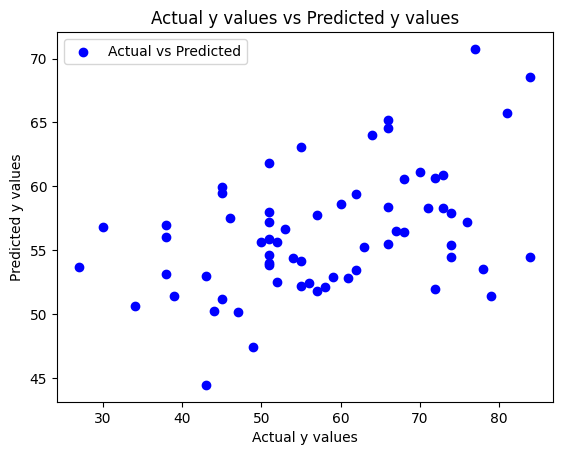

In [92]:
# Create a Random Forest Regressor
rf_regressor = RandomForestRegressor(n_estimators=50000, random_state=42)

# Train the model
rf_regressor.fit(x_train_scaled, y_train.ravel())

# Make predictions
y_pred = rf_regressor.predict(x_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse:.4f}")
print(f"R-squared: {r2:.4f}")

# Plot actual y values against predicted y values
plt.scatter(y_test, y_pred, color='blue', label='Actual vs Predicted')
plt.xlabel('Actual y values')
plt.ylabel('Predicted y values')
plt.title('Actual y values vs Predicted y values')
plt.legend()
plt.show()

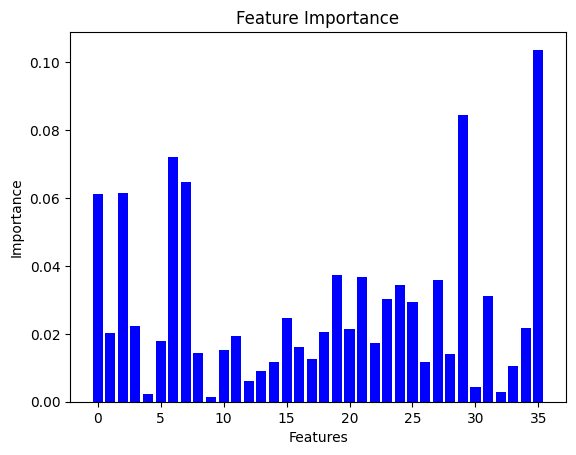

In [93]:
# Get feature importances
importances = rf_regressor.feature_importances_

# Create a bar plot for feature importances
plt.bar(range(len(importances)), importances, color='blue', align='center')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.show()

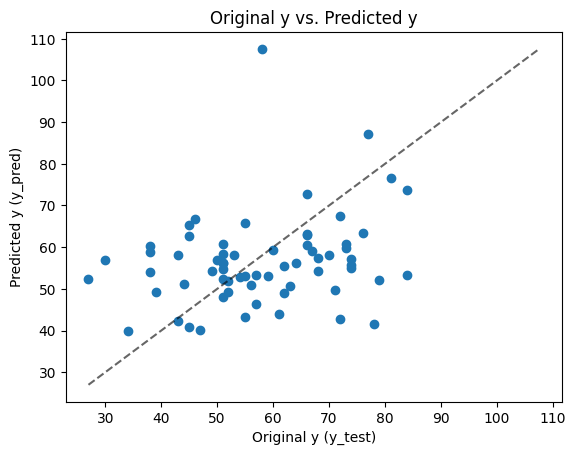

In [88]:
model = LinearRegression()
model.fit(x_train_scaled,y_train)
model.score(x_test_scaled,y_test)

y_pred = model.predict(x_test_scaled)

# Plot y_test vs. y_pred
plt.scatter(y_test, y_pred)
plt.xlabel('Original y (y_test)')
plt.ylabel('Predicted y (y_pred)')
plt.title('Original y vs. Predicted y')

# Add a diagonal line to indicate perfect predictions
limits = [min(min(y_test), min(y_pred)), max(max(y_test), max(y_pred))]
plt.plot(limits, limits, 'k--', alpha=0.6)

plt.show()

# Model Exploring

<br><br><br><b>Model Exploring</b><br>
In this section we will train and fine-turn various models to achieve the best prediction on our test dataset.

Please see a brief description of our work-plan:<br><br>
<b>Single Classifiers</b> - We will use a brute force method to train and fine tune 3 different Classifier types:
1. LogisticRegression
2. DecisionTreeClassifier
3. KNeighborsClassifier<br>

For each of these models, we wil try various hyper-parameter tunning and report the results.<br>

We will report the following:
* Trainning-Validation scores based on Cross-Validation
* Test scores based on test data prediction.
* AUC scores based on False-True/Negative-Positive ratios for each threshold and an ROC curve.<br>

We will then select our best performing model for feature importance, and attempt to improve its performence by removing features of low significance.

<b>Ensamle Models</b>:<br>
For this, we will split the training dataset into train80 and val.<br>
We will try and enhance the performence of a DecisionTreeClassifier model using the following bootstraping methods:<br>


<b>Boosting</b>
1. AdaBoostClassifier<br>

<b>Bagging:</b><br><br>
2. BaggingClassifier<br>
3. RandomForestClassifier<br>

We will report the following:
* Trainning scores based on train data pefromence.
* Validation scores based on validation dataset
* Test scores based on test data prediction.
* AUC scores based on False-True/Negative-Positive ration for each threshold and an ROC curve.<br>

We will then select our best performing method for feature importance, and attempt to improve its performence by removing features of low significance.

## Importing libraries

In [36]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor

from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier

from sklearn.metrics import mean_squared_error

List of models and hyper-parameters that we would like to examine:

## Creating Model Ouput Table

In [37]:
dict_of_models = {'LinearRegression':LinearRegression(),
                  'DecisionTreeRegressor':DecisionTreeRegressor()
                 }


Since different models have different hyper-parameters, we have composed a list of all parameters across our models and the values for each hyper parameter we would like to explore.

In [38]:
parametersOfValue = {
    'fit_intercept':[True,False],
    'n_neighbors':[2,4,8,15,50,80],
    'n_estimators':[50,100,500],
    'max_depth':[1,2,5,10,20,50],
    'learning_rate':[1,0.1,0.01,0.001,0.0001],
    'random_state':[1],
    'penalty':['l1','l2'],
    'solver':['saga'],
    'alpha':[1,0.1,0.01,0.001,0.0001],
    'C':[1,0.1,0.01,0.001,0.0001]
}

##Hyper Parameter Function:

The function is meant to iterate over our list of models, match them with the hyper-parameters relevant to them and provide a row for each model-parameter-combination.:<br>

In [39]:
# get lists and output a dict of combinations:

def create_combination_dict(classifierName,parametersOfValue):
    prop_combinations = list(itertools.product(*(parametersOfValue[Name] for Name in parametersOfValue)))
    combinationsDict ={}
    for i,item in enumerate(prop_combinations):
        modelTempName = "%s_%s"%(classifierName,i)
        #print(modelTempName)
        combinationsDict[modelTempName]={'model_type':classifierName}
        for j,colName in enumerate(parametersOfValue.keys()):
            combinationsDict[modelTempName][colName]=item[j]
    
    
    return combinationsDict



### --------------------------------------------------------------------------------------------------------------------###
#Example run:

combinationsDict = create_combination_dict('TestClassifier',parametersOfValue)
combinationsDict = pd.DataFrame(combinationsDict).T
combinationsDict.head(3)

,model_type,fit_intercept,n_neighbors,n_estimators,max_depth,learning_rate,random_state,penalty,solver,alpha,C
TestClassifier_0,TestClassifier,True,2,50,1,1,1,l1,saga,1,1
TestClassifier_1,TestClassifier,True,2,50,1,1,1,l1,saga,1,0.1
TestClassifier_2,TestClassifier,True,2,50,1,1,1,l1,saga,1,0.01


<br>The get_hyperparameter_combinations_per_classifier function receives a classifier and creates n rows of hyper-parameter combinations (Based on parametersOfValue list)

In [40]:
def get_hyperparameter_combinations_per_classifier(classifierName,regression_model,parametersOfValue):

    # Extract the hyper-parameters from our selected model:
    paramList = regression_model.get_params()

    classifierParametsOfValue = {}
    
    # Iterate over the parameters and match them to the parameter of value list:
    for param in paramList:
        if param in parametersOfValue.keys():
            classifierParametsOfValue[param]=parametersOfValue[param]

    # Convert list of hyper-parameters into a dictionary of parameter-combination
    combinationsDict_ForModel = create_combination_dict(classifierName,classifierParametsOfValue)

    relevantParametersForModel = combinationsDict_ForModel[list(combinationsDict_ForModel.keys())[0]].keys()
    print('Model Type: %s - %s hyper-parameter combinations'%(classifierName,len(combinationsDict_ForModel)))
    
    return combinationsDict_ForModel


### --------------------------------------------------------------------------------------------------------------------###
#Example run:


classifierName,regression_model = ('LinearRegression',LinearRegression())
combinationsDict_ForModel = get_hyperparameter_combinations_per_classifier(classifierName,regression_model,parametersOfValue=parametersOfValue)
pd.DataFrame(combinationsDict_ForModel).T.head(10)

Model Type: LinearRegression - 2 hyper-parameter combinations


,model_type,fit_intercept
LinearRegression_0,LinearRegression,True
LinearRegression_1,LinearRegression,False


<br>We then over our list of model, and for each model retrieve a list of all available hyper-parameter combinations and append them to dictionary

In [41]:
all_model_combinations = {}

for classifierName,regression_model in dict_of_models.items():
    #print(classifierName,regression_model)
    combinationsDict_ForModel = get_hyperparameter_combinations_per_classifier(classifierName,regression_model,parametersOfValue=parametersOfValue)
    #print(combinationsDict_ForModel)
    all_model_combinations.update(combinationsDict_ForModel)

all_model_combinations_df = pd.DataFrame(all_model_combinations).T

Model Type: LinearRegression - 2 hyper-parameter combinations
Model Type: DecisionTreeRegressor - 6 hyper-parameter combinations


<br>Our final result is a data frame containing all the model types and their hyper-parameters that we will use in our test.

In [42]:
print(f'There are {all_model_combinations_df.shape[0]} different model combinations for us to test')
all_model_combinations_df

There are 8 different model combinations for us to test


,model_type,fit_intercept,max_depth,random_state
LinearRegression_0,LinearRegression,True,NaN,NaN
LinearRegression_1,LinearRegression,False,NaN,NaN
DecisionTreeRegressor_0,DecisionTreeRegressor,NaN,1,1
DecisionTreeRegressor_1,DecisionTreeRegressor,NaN,2,1
DecisionTreeRegressor_2,DecisionTreeRegressor,NaN,5,1
DecisionTreeRegressor_3,DecisionTreeRegressor,NaN,10,1
DecisionTreeRegressor_4,DecisionTreeRegressor,NaN,20,1
DecisionTreeRegressor_5,DecisionTreeRegressor,NaN,50,1


## Brute strength testing

<br><b>Brute strength testing:</b><br><br>
Using the all_model_combinations_df we created, we can now iterate over our model instructions, and for each row:<br>
1. Update the model hyper-parameters based on the row instructions.
2. cross_validate the model and save the train/val scores to the data frame.
3. Fit the model on the entire train dataset.
4. Test the model using test data and save the test score to the data frame.
5. Use predict_proba method in the test and use these y probabilities to get our auc_result (** We will expand in it later in this notebook)
6. Save the AUC score to the data frame.

Additional outputs we will write to the data frame:
* Train/Test size
* Feature number
* Run time (In seconds)


In [43]:
dict_of_fitted_models = {}

for i,model_row in enumerate(all_model_combinations_df.T.items()):
    
    start = timer()
    
    # Take existing model and set it hyper parameters based on instructions:
    model_name = model_row[0]
    model_type = model_row[1][0]
    regression_model = clone(dict_of_models[model_type])
    model_props = regression_model.get_params()
    
    model_properties_instructions = model_row[1][1:]
     
    
    for prop_instruction in model_properties_instructions.index:
        if (prop_instruction in list(model_props.keys())):
            model_props[prop_instruction]=model_properties_instructions[prop_instruction]
            
    regression_model.set_params(**model_props)
    
    #print(f"Model Name: {model_name} - {regression_model}")
    
    cross_val = cross_validate(regression_model, x_train_scaled, y_train, cv=3, scoring='r2', return_train_score=True)
    
    train_score = (np.mean(cross_val['train_score']))
    val_score = (np.mean(cross_val['test_score'])    )
    
    # Fit on entire training data
    regression_model.fit(x_train_scaled, y_train)
    test_score = regression_model.score(x_test_scaled,y_test)
    
    all_model_combinations_df.at[model_name,'train_score']=train_score
    all_model_combinations_df.at[model_name,'val_score']=val_score
    all_model_combinations_df.at[model_name,'test_score']=test_score
    
    #yhat= regression_model.predict_proba(x_test_scaled)[:,1]
    yhat= regression_model.predict(x_test_scaled)
    mse = mean_squared_error(y_test, yhat)
    all_model_combinations_df.at[model_name,'test_mse']=mse
    
    #fpr, tpr, thresholds = roc_curve(y_test, yhat)
    #auc_result = auc(fpr,tpr)
    #all_model_combinations_df.at[model_name,'auc_result']=auc_result
    
    
    all_model_combinations_df.at[model_name,'train_size']=x_train_scaled.shape[0]
    all_model_combinations_df.at[model_name,'test_size']=x_test_scaled.shape[0]
    all_model_combinations_df.at[model_name,'feature_n']=x_test_scaled.shape[1]
        
    
    end = timer()
    run_time_secs = round(end - start,4)
    all_model_combinations_df.at[model_name,'run_time']=run_time_secs
    
    all_model_combinations_df.at[model_name,'trained_model']=regression_model
    dict_of_fitted_models[model_name] = regression_model
    
    print(f"Model Name: {model_name} - {regression_model} - val_score: {round(val_score,3)}.")

    #model_row['traingSize']=x_train_scaled.shape[0]
    #model_row['test_size']=x_test_scaled.shape[0]
    
    
print("Finished Run")

Model Name: LinearRegression_0 - LinearRegression() - val_score: -0.051.
Model Name: LinearRegression_1 - LinearRegression(fit_intercept=False) - val_score: -24.643.
Model Name: DecisionTreeRegressor_0 - DecisionTreeRegressor(max_depth=1, random_state=1) - val_score: -0.062.
Model Name: DecisionTreeRegressor_1 - DecisionTreeRegressor(max_depth=2, random_state=1) - val_score: -0.078.
Model Name: DecisionTreeRegressor_2 - DecisionTreeRegressor(max_depth=5, random_state=1) - val_score: -0.228.
Model Name: DecisionTreeRegressor_3 - DecisionTreeRegressor(max_depth=10, random_state=1) - val_score: -0.669.
Model Name: DecisionTreeRegressor_4 - DecisionTreeRegressor(max_depth=20, random_state=1) - val_score: -0.77.
Model Name: DecisionTreeRegressor_5 - DecisionTreeRegressor(max_depth=50, random_state=1) - val_score: -0.77.
Finished Run


In [44]:
cross_val

{'fit_time': array([0.00493789, 0.00458026, 0.00458765]),
 'score_time': array([0.00171232, 0.00163364, 0.00162578]),
 'test_score': array([-0.26522107, -0.80135467, -1.24308426]),
 'train_score': array([1., 1., 1.])}

In [45]:
y_test

movie_id
tt11286210    66.0
tt8115900     64.0
tt15325794    62.0
tt13650600    73.0
tt6462958     62.0
              ... 
tt10954984    77.0
tt6710474     81.0
tt14369780    67.0
tt3915174     73.0
tt15033192    52.0
Name: pred_metascore, Length: 65, dtype: float64

In [46]:
yhat

array([69., 56., 60., 63., 23., 48., 72., 52., 70., 66., 80., 49., 64.,
       52., 72., 68., 52., 51., 42., 30., 43., 42., 56., 42., 81., 30.,
       46., 43., 56., 64., 56., 60., 84., 60., 60., 34., 61., 65., 48.,
       54., 81., 60., 67., 64., 51., 76., 42., 65., 54., 68., 44., 30.,
       59., 60., 35., 52., 55., 64., 73., 50., 87., 48., 42., 30., 60.])

<br>Finally, we will have a data frame containning our models, their instructions, and their resaults:

In [47]:
print(f"All model and their scores sorted by name")
all_model_combinations_df

All model and their scores sorted by name


,model_type,fit_intercept,max_depth,random_state,train_score,val_score,test_score,test_mse,train_size,test_size,feature_n,run_time,trained_model
LinearRegression_0,LinearRegression,True,NaN,NaN,0.353530,-0.051219,-0.236141,226.459900,257.0,65.0,36.0,0.0721,LinearRegression()
LinearRegression_1,LinearRegression,False,NaN,NaN,-14.746999,-24.643040,-18.643667,3598.701166,257.0,65.0,36.0,0.0502,LinearRegression(fit_intercept=False)
DecisionTreeRegressor_0,DecisionTreeRegressor,NaN,1,1,0.084465,-0.061883,0.121062,161.020662,257.0,65.0,36.0,0.0417,"DecisionTreeRegressor(max_depth=1, random_stat..."
DecisionTreeRegressor_1,DecisionTreeRegressor,NaN,2,1,0.171383,-0.077577,-0.030813,188.843969,257.0,65.0,36.0,0.0415,"DecisionTreeRegressor(max_depth=2, random_stat..."
DecisionTreeRegressor_2,DecisionTreeRegressor,NaN,5,1,0.462313,-0.227799,-0.302620,238.638833,257.0,65.0,36.0,0.0418,"DecisionTreeRegressor(max_depth=5, random_stat..."
DecisionTreeRegressor_3,DecisionTreeRegressor,NaN,10,1,0.905215,-0.668994,-0.677864,307.383046,257.0,65.0,36.0,0.0438,"DecisionTreeRegressor(max_depth=10, random_sta..."
DecisionTreeRegressor_4,DecisionTreeRegressor,NaN,20,1,1.000000,-0.769887,-0.869929,342.569231,257.0,65.0,36.0,0.0385,"DecisionTreeRegressor(max_depth=20, random_sta..."
DecisionTreeRegressor_5,DecisionTreeRegressor,NaN,50,1,1.000000,-0.769887,-0.869929,342.569231,257.0,65.0,36.0,0.0401,"DecisionTreeRegressor(max_depth=50, random_sta..."


<br><b>Best Performing model:</b><br>
Since we collected all sort of output scores from our model, we can check and see which model performed best for each category:

"Show off" award:<br>
The award for the model with the best training score:

In [48]:
cols_to_show = ['model_type','fit_intercept','max_depth','train_score','val_score','test_score','test_mse','run_time']
print(f"Top 3 performing models based on Validation Score")
all_model_combinations_df[cols_to_show].sort_values(by='val_score', ascending=False).head(3)

Top 3 performing models based on Validation Score


,model_type,fit_intercept,max_depth,train_score,val_score,test_score,test_mse,run_time
LinearRegression_0,LinearRegression,True,NaN,0.353530,-0.051219,-0.236141,226.459900,0.0721
DecisionTreeRegressor_0,DecisionTreeRegressor,NaN,1,0.084465,-0.061883,0.121062,161.020662,0.0417
DecisionTreeRegressor_1,DecisionTreeRegressor,NaN,2,0.171383,-0.077577,-0.030813,188.843969,0.0415


Accuracy award:<br>
The award for best overall test score model (Based on proportion of correct predictions made by the classifier)

In [49]:

print(f"Top 3 performing models based on Test Score")
all_model_combinations_df[cols_to_show].sort_values(by='test_score', ascending=False).head(3)

Top 3 performing models based on Test Score


,model_type,fit_intercept,max_depth,train_score,val_score,test_score,test_mse,run_time
DecisionTreeRegressor_0,DecisionTreeRegressor,NaN,1,0.084465,-0.061883,0.121062,161.020662,0.0417
DecisionTreeRegressor_1,DecisionTreeRegressor,NaN,2,0.171383,-0.077577,-0.030813,188.843969,0.0415
LinearRegression_0,LinearRegression,True,NaN,0.353530,-0.051219,-0.236141,226.459900,0.0721


AUC award:<br>
The award for the model best able to distinguish between the two classes by plotting the true positive rate (TPR) against the false positive rate (FPR) at different classification thresholds and calculating the area under their curve

In [50]:

print(f"Top 3 performing models based on AUC Score")
all_model_combinations_df[cols_to_show].sort_values(by='auc_result', ascending=False).head(3)

Top 3 performing models based on AUC Score


KeyError: ignored

<br><b>ROC Curve:</b><br>
We will now plot the ratio between true positive rate (TPR) against the false positive rate (FPR) at different classification thresholds for the best performing model of each classifier type.

In [ ]:
def plot_roc_curve(model,X,Y, model_name="Classification Model"):
    
    # Plot the ROC curve
    yhat= model.predict_proba(X)[:,1]

    fpr, tpr, thresholds = roc_curve(Y, yhat)
    auc_result = auc(fpr,tpr)

    x=np.arange(0,100)/100
    ax.plot(x,x,'--',color="gray",alpha=0.3)
    ax.plot(fpr,tpr,label=model_name)
    ax.set_ylabel("True Positive Rate")
    ax.set_xlabel("False Positive Rate")
    ax.set_title(f"ROC Curve for top performing models.")
    ax.legend()
    ax.plot()

In [ ]:
list_of_unique_model_types = list(dict_of_models.keys())
col_size = 2

fig, ax = plt.subplots(1,1, figsize=(10,10))

for i, item in enumerate(all_model_combinations_df.sort_values(by='auc_result', ascending=False).T.items()):
    model_name = item[0]
    model_record = item[1]
    model_type = model_record['model_type']
    
    if model_type in list_of_unique_model_types:
        trained_model = model_record['trained_model'].fit(x_train_scaled,y_train)
    
        plot_roc_curve(trained_model,x_test_scaled,y_test,model_name=model_name)
        
        list_of_unique_model_types.remove(model_type)
    

In [ ]:
best_performing_model = all_model_combinations_df.sort_values(by='auc_result', ascending=False).head(1)
best_model = best_performing_model['trained_model'][0].fit(x_train_scaled,y_train)
print(f"Our best performing model so far is {best_model} --> {round(best_performing_model['auc_result'][0],3)} AUC score")

<br><b>Confusion Matrix:</b><br>
We will observe our predictions and try and see how the model preforms on each of the classes:

In [ ]:
predicted_labels  = best_model.predict(x_test_scaled)
confusion_mat = confusion_matrix(y_test, predicted_labels)

# print the confusion matrix
pd.DataFrame(confusion_mat,columns=["P.Flop","P.Hit"],index=["Flop","Hit"])

In [ ]:
y_test.value_counts()

<br><b>Feature importance:</b><br>
Since KNeighborsClassifier doesn't provide a clear way to calculate feature importance, we will go to the 2nd best modele which isn't KNeighborsClassifier to get this information from

In [ ]:
second_best_performing_model = all_model_combinations_df[all_model_combinations_df['model_type']=="DecisionTreeClassifier"].sort_values(by='auc_result', ascending=False).head(1)
second_best_model = second_best_performing_model['trained_model'][0].fit(x_train_scaled,y_train)
print(f"Our best performing model so far is {second_best_model} --> {round(second_best_performing_model['auc_result'][0],3)} AUC score")

In [ ]:
x_df = x_train_scaled.copy()
x_df = x_df.reset_index()
_y_train = y_train.reset_index(drop=True)
x_df['y'] = _y_train
model = clone(second_best_model)

n = x_df.shape[0]
result_list = []
coef_list = {col:[] for col in x_train_scaled.columns}

bar = progressbar.ProgressBar(maxval=100, widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])
bar.start()
for i in range(100):
    #Take a random sample from the df:
    x_df_sample = x_df.sample(n=n,replace=True)
    
    # Split the df into x and y
    y_ = x_df_sample['y']
    x_ = x_df_sample.copy().drop('y', axis=1)
    
    # Initialize a Linear Regression object with fit_intercept as False
    
    
    model.fit(x_,y_)
    
    # Extract the coefficients from the trained model and store them in a list
    coefficients = model.feature_importances_
    
    for n,coef_name in enumerate(x_train_scaled.columns):
        coef_value = coefficients[n]
        coef_list[coef_name].append(coef_value)
        
    bar.update(i)
        
coef_df = pd.DataFrame(coef_list)

In [ ]:
coef_df = pd.DataFrame(coef_list)
coef_df.head(10)

In [ ]:
coef_df.mean().sort_values(ascending=False).round(4)

In [ ]:
# Create a dict for each coef containnig the 95% confidence interval
threshold_for_feature_importance = 0.1
coef_info = {}

features_to_keep = []

for feature, coef in coef_df.items():
    conf_int = np.percentile(coef,[2.5,97.5])
    coef_info[feature]=conf_int
    
    min_precentile = conf_int[0]
    max_precentile = conf_int[1]
    
    if max_precentile >= threshold_for_feature_importance: 
        features_to_keep.append(feature)
        print(f"For coef {feature} the low 5% is {round(min_precentile,3)} and the high 95% is {round(max_precentile,3)}")
    else:
        print(f"For coef {feature} the low 5% is {round(min_precentile,3)} and the high 95% is {round(max_precentile,3)} - Dropping feature.")
    
    
    

In [ ]:
print(f"{len(features_to_keep)} features to keep: \n{features_to_keep}")

In [ ]:
# Plot all the coefficients histogram seperatly



coeff_num = coef_df.shape[1]
row_num = math.ceil(coeff_num/2)
bin_start = min(coef_df.min())
bin_end = max(coef_df.max())

fig = plt.gcf()
fig.set_size_inches(20,120)
bins = np.linspace(bin_start, bin_end, 30)
c_list = ['g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink']


for i,(coef,values) in enumerate(coef_df.items()):
    
    ax = fig.add_subplot(row_num,2,i+1)
    
    height, bins, patches = ax.hist(values, bins, alpha=0.5, label=f"Feature: '{coef}'",density=True,edgecolor='k', color=c_list[i])
    
    ax.fill_betweenx([0, height.max()], coef_info[coef][0], coef_info[coef][1], alpha=0.2)
    ax.axline((threshold_for_feature_importance, 0), 
              (threshold_for_feature_importance, 1), 
              linestyle='dashed',
              slope=None, color='black', label='Threshold')
    
    ax.legend(loc='upper right',fontsize=13)
    ax.set_xlabel('Coef Weight')
    ax.set_ylabel('Distribution',rotation=0,labelpad=25)
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_title(f"Coef distribution per '{coef}'")
    i+=1

plt.tight_layout()
plt.plot;

<br>We will now attempt to re-train the same model on the significant features only

In [ ]:
print(f"Features to keep: {features_to_keep}")

In [ ]:
model_name = 'DecisionTreeClassifier_3_thin'
regression_model = clone(second_best_model)

start = timer()

cross_val = cross_validate(regression_model, x_train_scaled[features_to_keep], y_train, cv=3, scoring='accuracy', return_train_score=True)
    
train_score = np.mean(cross_val['train_score'])
val_score = np.mean(cross_val['test_score'])    

# Fit on entire training data
regression_model.fit(x_train_scaled[features_to_keep], y_train)
test_score = regression_model.score(x_test_scaled[features_to_keep],y_test)

all_model_combinations_df.at[model_name,'train_score']=train_score
all_model_combinations_df.at[model_name,'val_score']=val_score
all_model_combinations_df.at[model_name,'test_score']=test_score

yhat= regression_model.predict_proba(x_test_scaled[features_to_keep])[:,1]

fpr, tpr, thresholds = roc_curve(y_test, yhat)
auc_result = auc(fpr,tpr)
all_model_combinations_df.at[model_name,'auc_result']=auc_result


all_model_combinations_df.at[model_name,'train_size']=x_train_scaled.shape[0]
all_model_combinations_df.at[model_name,'test_size']=x_test_scaled.shape[0]
all_model_combinations_df.at[model_name,'feature_n']=x_test_scaled.shape[1]

all_model_combinations_df.at[model_name,'trained_model']=regression_model

end = timer()
run_time_secs = round(end - start,4)
all_model_combinations_df.at[model_name,'run_time']=run_time_secs

all_model_combinations_df.at[model_name,'trained_model']=regression_model

print(f"{model_name} - Val: {round(val_score,3)}, Test: {round(test_score,3)}, AUC: {round(auc_result,3)}")

<br>Let us also check how much this improved our KNeighborsClassifier:

In [ ]:
model_name = 'KNeighborsClassifier_5_thin'
regression_model = clone(best_model)

start = timer()

cross_val = cross_validate(regression_model, x_train_scaled[features_to_keep], y_train, cv=3, scoring='accuracy', return_train_score=True)
    
train_score = np.mean(cross_val['train_score'])
val_score = np.mean(cross_val['test_score'])    

# Fit on entire training data
regression_model.fit(x_train_scaled[features_to_keep], y_train)
test_score = regression_model.score(x_test_scaled[features_to_keep],y_test)

all_model_combinations_df.at[model_name,'train_score']=train_score
all_model_combinations_df.at[model_name,'val_score']=val_score
all_model_combinations_df.at[model_name,'test_score']=test_score

yhat= regression_model.predict_proba(x_test_scaled[features_to_keep])[:,1]

fpr, tpr, thresholds = roc_curve(y_test, yhat)
auc_result = auc(fpr,tpr)
all_model_combinations_df.at[model_name,'auc_result']=auc_result


all_model_combinations_df.at[model_name,'train_size']=x_train_scaled[features_to_keep].shape[0]
all_model_combinations_df.at[model_name,'test_size']=x_test_scaled[features_to_keep].shape[0]
all_model_combinations_df.at[model_name,'feature_n']=x_test_scaled[features_to_keep].shape[1]


all_model_combinations_df.at[model_name,'trained_model']=regression_model


end = timer()
run_time_secs = round(end - start,4)
all_model_combinations_df.at[model_name,'run_time']=run_time_secs

all_model_combinations_df.at[model_name,'trained_model']=regression_model

print(f"{model_name} - Val: {round(val_score,3)}, Test: {round(test_score,3)}, AUC: {round(auc_result,3)}")

In [ ]:
all_model_combinations_df.sort_values(by='auc_result', ascending=False).head(10)

<br><b>Ensemble Models:</b><br>
Ensemble models are machine learning algorithms that combine the predictions of multiple base models to make more accurate predictions.

In [ ]:
# Make a dict to store fitted models and the features we used:
ensemble_model_list = []

Unlike Single Classification models where we used cross-val on our training set, for Bootstrapping methods we will need to create a separate validation data-set

In [ ]:
random_state=1
X_train80, X_val, y_train80, y_val = train_test_split(x_train_scaled,
                                                      y_train,
                                                      train_size=.8,
                                                      random_state=random_state,
                                                      stratify=y_train)

<br><b>Boosting:</b><br>
AdaBoostClassifier is an adaptive boosting algorithm, which means that it trains the base models sequentially, with each model focusing on the examples that were misclassified by the previous model. This allows the base models to learn from each other and improve the performance of the overall model. 

Since the computational power of these models is expansive, we have already fine tuned the hyper-parameters in advance and found that the models perform best with the following settings: 

In [ ]:
# Define start parameters

n_estimators=500

depth_range = [1,3,5,7]
random_state=1
learning_rate=0.05
algorithm_='SAMME.R'


### Note: This code part is intended for Q4.5
best_total_score = 0
best_score_dept = 1
best_n_estimators = 1

fig = plt.figure(figsize=(32,8))

for i,dept in enumerate(depth_range):
    
    start = timer()
    
    model_name = f'AdaBoostClassifier_{n_estimators}_estimators_{dept}_dept'
    
    ada = AdaBoostClassifier(DecisionTreeClassifier(max_depth=dept),
                            learning_rate=learning_rate,
                            algorithm=algorithm_,
                             n_estimators=n_estimators
                            )
    ada.fit(X_train80, y_train80)
    
    staged_score_train = list(ada.staged_score(X_train80, y_train80))
    staged_score_val = list(ada.staged_score(X_val, y_val))
    
    ### Note: This code part is intended for Q4.5
    # Check if the new max score exceeded the best score from the previous runs. If so - Update it.
    best_run_score = np.max(staged_score_val)
    if best_run_score>best_total_score:
        
        best_total_score=best_run_score
        best_score_dept=dept
        # Get the n_estimators by getting the index of the peak of the validation score 
        best_n_estimators = staged_score_val.index(best_run_score)
        
        train_score = staged_score_train[best_n_estimators]
        val_score = best_total_score
        
        ada = AdaBoostClassifier(DecisionTreeClassifier(max_depth=best_score_dept),
                            learning_rate=learning_rate,
                            algorithm=algorithm_,
                             n_estimators=best_n_estimators
                            )
        ada.fit(x_train_scaled, y_train)
        
        test_score = ada.score(x_test_scaled, y_test)
        
        all_model_combinations_df.at[model_name,'n_estimators']=best_n_estimators
        all_model_combinations_df.at[model_name,'random_state']=random_state
        all_model_combinations_df.at[model_name,'learning_rate']=learning_rate
        all_model_combinations_df.at[model_name,'max_depth']=best_score_dept
        all_model_combinations_df.at[model_name,'model_type']="AdaBoostClassifier"
        
        all_model_combinations_df.at[model_name,'train_score']=train_score
        all_model_combinations_df.at[model_name,'val_score']=val_score
        all_model_combinations_df.at[model_name,'test_score']=test_score
        
        yhat= ada.predict_proba(x_test_scaled)[:,1]

        fpr, tpr, thresholds = roc_curve(y_test, yhat)
        auc_result = auc(fpr,tpr)
        all_model_combinations_df.at[model_name,'auc_result']=auc_result


        all_model_combinations_df.at[model_name,'train_size']=x_train_scaled.shape[0]
        all_model_combinations_df.at[model_name,'test_size']=x_test_scaled.shape[0]
        all_model_combinations_df.at[model_name,'feature_n']=x_test_scaled.shape[1]
        
        ensemble_model_list.append({"model_name":model_name, "yhat":yhat, "auc_result":auc_result })
        
        end = timer()
        run_time_secs = round(end - start,4)
        all_model_combinations_df.at[model_name,'run_time']=run_time_secs
        
        #if dept>1:
        print(f"New best score was found of {round(best_total_score,4)} High was found for Dept: {dept}, best_n_estimators: {best_n_estimators}")
    
    ax = fig.add_subplot(1,len(depth_range),i+1)

    # Plot the training error with labels
    ax.plot(range(n_estimators), staged_score_train, label = f'staged_score_train', linewidth=1, alpha=1)
    ax.plot(range(n_estimators), staged_score_val, label = f'staged_score_test', linewidth=1, alpha=1)

    # Set the plot labels and legends
    ax.set_xlabel('estimator_num', fontsize=12)
    ax.set_ylabel('Accuracy', fontsize=12)
    ax.set_title(f"Boosing Accuracy for model dept {dept}",fontsize=14)

    plt.ylim([0.65, 1.01])

    ax.legend()

plt.show();    
    

<br>We can observe our model in the output table:

In [ ]:
print(f"The best observed accuracty was observed for dept {best_score_dept} with n_estimator {best_n_estimators}. Score: {best_total_score}")

In [ ]:
columns_to_display = ['train_score','val_score','test_score','auc_result','feature_n','run_time']
all_model_combinations_df[all_model_combinations_df["model_type"]=="AdaBoostClassifier"][columns_to_display].round(4)

For Boosting model we would prefer to keep our trees shallow and non-complex, since they are built sequntially and we do not want to risk ovefitting.<br>
Next, we would like to explor some highly deel trees:

<br><b>Bagging:</b><br>
In BaggingClassifier, the subsets of the training data are generated using bootstrap sampling, which means that each subset is a random sample of the training data with replacement.<br>
It involves training multiple base models independently on different subsets of the training data, and then combining the predictions of the individual base models to make a final prediction.

In [ ]:
n_estimators=500
max_depth=20
random_state=1

In [ ]:

base_estimator = DecisionTreeClassifier(max_depth=max_depth, random_state=random_state)


In [ ]:
model_name = f'BaggingClassifier_{n_estimators}_estimators_{max_depth}_dept'

regression_model = BaggingClassifier(base_estimator=base_estimator,
                                    random_state=random_state,
                                    n_estimators=n_estimators)

start = timer()

# Populate hyper Parameters into df
all_model_combinations_df.at[model_name,'n_estimators']=n_estimators
all_model_combinations_df.at[model_name,'random_state']=random_state
all_model_combinations_df.at[model_name,'learning_rate']=learning_rate
all_model_combinations_df.at[model_name,'max_depth']=max_depth
all_model_combinations_df.at[model_name,'model_type']="BaggingClassifier"

# Fit on entire training data
regression_model.fit(X_train80, y_train80)

# Get model train and test scores
train_score = regression_model.score(X_train80, y_train80)
val_score = regression_model.score(X_val, y_val)
test_score = regression_model.score(x_test_scaled,y_test)

all_model_combinations_df.at[model_name,'train_score']=train_score
all_model_combinations_df.at[model_name,'val_score']=val_score
all_model_combinations_df.at[model_name,'test_score']=test_score

yhat= regression_model.predict_proba(x_test_scaled)[:,1]

fpr, tpr, thresholds = roc_curve(y_test, yhat)
auc_result = auc(fpr,tpr)
all_model_combinations_df.at[model_name,'auc_result']=auc_result


all_model_combinations_df.at[model_name,'train_size']=X_train80.shape[0]
all_model_combinations_df.at[model_name,'test_size']=x_test_scaled.shape[0]
all_model_combinations_df.at[model_name,'feature_n']=x_test_scaled.shape[1]

ensemble_model_list.append({"model_name":model_name, "yhat":yhat, "auc_result":auc_result })

end = timer()
run_time_secs = round(end - start,4)
all_model_combinations_df.at[model_name,'run_time']=run_time_secs


print(f"{model_name} - Train: {round(train_score,3)}, Test: {round(test_score,3)}, AUC: {round(auc_result,3)}")

In [ ]:
columns_to_display = ['train_score','val_score','test_score','auc_result','feature_n','run_time']
all_model_combinations_df[columns_to_display].filter(items = [model_name], axis=0).round(4)

<br><b>Bagging feature importance:</b><br>
For regular bagging the top selected feature will always be the same

In [ ]:
col_names = x_train_scaled.columns

top_feature_dict = {col:0 for col in col_names}

for dtree in regression_model.estimators_:
    top_feature_Id = dtree.tree_.feature[0]
    top_feature_name = col_names[top_feature_Id]
    
    top_feature_dict[top_feature_name]+=1
    
top_predictors_bagging = pd.DataFrame(top_feature_dict, index=["Top Count - Bagging"]).head(1).T
top_predictors_bagging.sort_values(["Top Count - Bagging"], ascending=False).head(10)

<br><b>Random Forest:</b><br>
Random forest uses decision trees as the base model and trains them using a random subset of the features, and it combines the predictions using a weighted averageRandom forest uses decision trees as the base model and trains them using a random subset of the features, and it combines the predictions using a weighted average.

In [ ]:
n_estimators=500
max_depth=20
random_state=1

In [ ]:
model_name = f'RandomForestClassifier_{n_estimators}_estimators_{max_depth}_dept'

regression_model = RandomForestClassifier(n_estimators=n_estimators,
                                         max_depth=max_depth,
                                         max_features='sqrt', 
                                         random_state=random_state)

start = timer()

# Populate hyper Parameters into df
all_model_combinations_df.at[model_name,'n_estimators']=n_estimators
all_model_combinations_df.at[model_name,'random_state']=random_state
all_model_combinations_df.at[model_name,'learning_rate']=learning_rate
all_model_combinations_df.at[model_name,'max_depth']=max_depth
all_model_combinations_df.at[model_name,'model_type']="RandomForestClassifier"

# Fit on entire training data
regression_model.fit(x_train_scaled, y_train)

# Get model train and test scores
train_score = regression_model.score(X_train80, y_train80)
val_score = regression_model.score(X_val, y_val)
test_score = regression_model.score(x_test_scaled,y_test)

all_model_combinations_df.at[model_name,'train_score']=train_score
all_model_combinations_df.at[model_name,'val_score']=val_score
all_model_combinations_df.at[model_name,'test_score']=test_score

yhat= regression_model.predict_proba(x_test_scaled)[:,1]

fpr, tpr, thresholds = roc_curve(y_test, yhat)
auc_result = auc(fpr,tpr)
all_model_combinations_df.at[model_name,'auc_result']=auc_result


all_model_combinations_df.at[model_name,'train_size']=X_train80.shape[0]
all_model_combinations_df.at[model_name,'test_size']=x_test_scaled.shape[0]
all_model_combinations_df.at[model_name,'feature_n']=x_test_scaled.shape[1]

ensemble_model_list.append({"model_name":model_name, "yhat":yhat, "auc_result":auc_result })

end = timer()
run_time_secs = round(end - start,4)
all_model_combinations_df.at[model_name,'run_time']=run_time_secs


print(f"{model_name} - Train: {round(train_score,3)}, Test: {round(test_score,3)}, AUC: {round(auc_result,3)}")

In [ ]:
columns_to_display = ['train_score','val_score','test_score','auc_result','feature_n','run_time']
all_model_combinations_df[columns_to_display].filter(items = [model_name], axis=0).round(4)

<br><b>Confusion Matrix:</b><br>
We will observe our predictions and try and see how the model preforms on each of the classes:

In [ ]:
predicted_labels  = regression_model.predict(x_test_scaled)
confusion_mat = confusion_matrix(y_test, predicted_labels)

# print the confusion matrix
pd.DataFrame(confusion_mat,columns=["P.Flop","P.Hit"],index=["Flop","Hit"])

<br><b>Random Forest feature selection:</b><br>
Same as bagging, only with random feature selection

In [ ]:
top_feature_dict = {col:0 for col in col_names}

for dtree in regression_model.estimators_:
    top_feature_Id = dtree.tree_.feature[0]
    top_feature_name = col_names[top_feature_Id]
    
    top_feature_dict[top_feature_name]+=1
    
top_predictors_bagging = pd.DataFrame(top_feature_dict, index=["Top Count - Random Forest"]).head(1).T
top_predictors_bagging.sort_values(["Top Count - Random Forest"], ascending=False)

In [ ]:
columns_to_run = list(top_predictors_bagging[top_predictors_bagging['Top Count - Random Forest']>10].index)
columns_to_run

In [ ]:
random_forest_model_thin = RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth,max_features='sqrt', random_state=random_state)
random_forest_model_thin.fit(x_train_scaled[columns_to_run],y_train)

In [ ]:
model_name = f'RandomForestClassifier_Thin_{n_estimators}_estimators_{max_depth}_dept'

regression_model = RandomForestClassifier(n_estimators=n_estimators,
                                         max_depth=max_depth,
                                         max_features='sqrt', 
                                         random_state=random_state)

start = timer()

# Populate hyper Parameters into df
all_model_combinations_df.at[model_name,'n_estimators']=n_estimators
all_model_combinations_df.at[model_name,'random_state']=random_state
all_model_combinations_df.at[model_name,'learning_rate']=learning_rate
all_model_combinations_df.at[model_name,'max_depth']=max_depth
all_model_combinations_df.at[model_name,'model_type']="RandomForestClassifier"

# Fit on entire training data
regression_model.fit(X_train80[columns_to_run], y_train80)

# Get model train and test scores
train_score = regression_model.score(X_train80[columns_to_run],y_train80)
val_score = regression_model.score(X_val[columns_to_run],y_val)
test_score = regression_model.score(x_test_scaled[columns_to_run],y_test)

all_model_combinations_df.at[model_name,'train_score']=train_score
all_model_combinations_df.at[model_name,'val_score']=val_score
all_model_combinations_df.at[model_name,'test_score']=test_score

yhat= regression_model.predict_proba(x_test_scaled[columns_to_run])[:,1]

fpr, tpr, thresholds = roc_curve(y_test, yhat)
auc_result = auc(fpr,tpr)
all_model_combinations_df.at[model_name,'auc_result']=auc_result


all_model_combinations_df.at[model_name,'train_size']=X_train80[columns_to_run].shape[0]
all_model_combinations_df.at[model_name,'test_size']=x_test_scaled[columns_to_run].shape[0]
all_model_combinations_df.at[model_name,'feature_n']=x_test_scaled[columns_to_run].shape[1]

ensemble_model_list.append({"model_name":model_name, "yhat":yhat, "auc_result":auc_result })


end = timer()
run_time_secs = round(end - start,4)
all_model_combinations_df.at[model_name,'run_time']=run_time_secs

print(f"{model_name} - Train: {round(train_score,3)}, Test: {round(test_score,3)}, AUC: {round(auc_result,3)}")

In [ ]:
columns_to_display = ['train_score','val_score','test_score','auc_result','feature_n','run_time']
all_model_combinations_df[columns_to_display].filter(items = [model_name], axis=0).round(4)

<br><br><b>Comparing the final results</b><br>


<br><b>Best Performing model:</b><br>
Since we collected all sort of output scores from our model, we can check and see which model performed best for each category:

"Show off" award:<br>
The award for the model with the best training score:

In [ ]:
cols_to_show = ['model_type','C','penalty','solver','max_depth','n_neighbors','train_score','val_score','test_score','auc_result','run_time']
print(f"Top 3 performing models based on Train Score")
all_model_combinations_df[cols_to_show].sort_values(by='train_score', ascending=False).head(3)

Accuracy award:<br>
The award for best overall test score model (Based on proportion of correct predictions made by the classifier)

In [ ]:

print(f"Top 3 performing models based on Test Score")
all_model_combinations_df[cols_to_show].sort_values(by='test_score', ascending=False).head(3)

AUC award:<br>
The award for the model best able to distinguish between the two classes by plotting the true positive rate (TPR) against the false positive rate (FPR) at different classification thresholds and calculating the area under their curve

In [ ]:
print(f"Top 3 performing models based on AUC Score")
all_model_combinations_df[cols_to_show].sort_values(by='auc_result', ascending=False).head(3)

In [ ]:
def plot_roc_curve_yhat(X,Y, yhat, model_name="Classification Model"):
    
    # Plot the ROC curve
    fpr, tpr, thresholds = roc_curve(Y, yhat)
    auc_result = auc(fpr,tpr)

    x=np.arange(0,100)/100
    ax.plot(x,x,'--',color="gray",alpha=0.3)
    ax.plot(fpr,tpr,label=model_name)
    ax.set_ylabel("True Positive Rate")
    ax.set_xlabel("False Positive Rate")
    ax.set_title(f"ROC Curve for top performing models.")
    ax.legend()
    ax.plot()

In [ ]:
col_size = 2

fig, ax = plt.subplots(1,1, figsize=(10,10))

for i, item in enumerate(ensemble_model_list):
    
    model_name = item["model_name"]
    yhat_ = item["yhat"]
    auc_result_ = item['auc_result']
    
    plot_roc_curve_yhat(x_test_scaled,y_test,yhat_,model_name=model_name)


Now that we have trained and tested all our models, we can compare them to each other:

In [ ]:
columns_to_display = ['train_score','val_score','test_score','auc_result','feature_n','run_time']
all_model_combinations_df[columns_to_display].sort_values(by='auc_result', ascending=False).head(15)

When we set on our way our goal was to find the best performing model which will provide us not only with good accuracy, but also with a balances False-To-Positive ratio across different thresholds.<br>
After examining all various models and features, we have found that our most reliable model will be a RandomForestClassifier with a depth of 20 for each DecisionTree.<br>
The model should be trained on the entire dataset (regardless of feature importance) and predict with all features.<br>
